# **Neuropolis: Building an artificial intelligence system for human brain activity prediction (EEG, fMRI)**

#### Version: 10th March 2024

==============================================================================================

Project developed by Maël Donoso, Ph.D. in Cognitive and Computational Neuroscience. Affiliations: Ouroboros Neurotechnologies (https://ouroboros-neurotechnologies.com/), Institut Lémanique du Cerveau (https://institut-cerveau.ch/), Policlinique Ostéopathique de Lausanne (https://policlinique-osteopathique-lausanne.ch/). 

==============================================================================================

This project is presented through nine Notebooks:

***01: fMRI Preprocessing***

*02: EEG Preprocessing*

*03: Linear Regression*

*04: KNN, Decision Trees, Random Forests, SVM*

*05: Neural Networks*

*06: Convolutional Neural Networks*

*07: Recurrent Neural Networks*

*08: Transformers*

*09: Human Brain Predictability Map*

==============================================================================================

### Notebook 01

# **fMRI Preprocessing**

## **1. fMRI Data Extraction**

- **Data**: We extract the fMRI data from the brain images obtained after the fMRIPrep preprocessing step (neuropolis/README.md). From each brain image, we should be able to extract a 4D NumPy array with dimensions (76, 95, 40, 210), where the fourth dimension corresponds to the number of scans, and the first three dimensions correspond to the three standard neurological views: sagittal (x), coronal (y), axial (z). In this 4D NumPy array, each value corresponds to the BOLD (Blood Oxygen Level Dependent) signal in a particular voxel of the brain, and for a particular scan. 

- **Library**: In order to extract the 4D NumPy arrays from the NIFTI files (.nii), or more exactly from the compressed NIFTI files (.nii.gz), we use NiBabel, a library dedicated to neuroimaging: https://nipy.org/nibabel/nibabel_images.html. The NIFTI files also contain some metadata. A complete definition of the NIFTI header can be found here: https://nifti.nimh.nih.gov/pub/dist/src/niftilib/nifti1.h. 

- **Plots**: Once the fMRI data is extracted, we plot some brain images through the middle section of the sagittal, coronal and axial views, and observe that different brain regions show different activity patterns. When visualizing such images, we must remember that we are only looking at 2D sections of a larger 3D volume, and that each 3D volume is just one scan inside a larger 4D array. By construction, a large part of the values will be irrelevant for our analysis, since only the central voxels represent the brain of the subject. We can limit our observation to these voxels by using the mask provided by fMRIPrep. We also display the difference between the first and the second scan, and between the first and the last scan, as a security check for ensuring that our scans are effectively different. 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import nibabel as nib
from nilearn import image
import os
import pickle

In [2]:
# Define the fmriprep data path. 
fmriprep_data_path = '../neuropolis_fmriprep_data/'

# Define the preprocessed data path. 
preprocessed_data_path = '../neuropolis_preprocessed_data/'

In [3]:
# Define the list of subjects. 
subjects = ['sub-xp1' + str(x).zfill(2) for x in range(1, 11)]
print(subjects)

['sub-xp101', 'sub-xp102', 'sub-xp103', 'sub-xp104', 'sub-xp105', 'sub-xp106', 'sub-xp107', 'sub-xp108', 'sub-xp109', 'sub-xp110']


In [4]:
# Define an example subject. 
subject = subjects[0]
subject

'sub-xp101'

In [5]:
# Load a NIFTI image using the NiBabel library, and display its size. 
img = nib.load(fmriprep_data_path + subject + '/func/' +  subject + '_task-eegfmriNF_space-MNI152Lin_desc-preproc_bold.nii.gz')
img.shape

(76, 95, 40, 210)

In [6]:
# Extract the image data, and display its size. 
image_data = img.get_fdata()
image_data.shape

(76, 95, 40, 210)

In [7]:
# Display the number of scans. 
nb_scans = image_data.shape[3]
nb_scans

210

In [8]:
# Check that the image data is a NumPy array. 
type(image_data) == np.ndarray

True

In [9]:
# Check that the image data is in float64 format. 
image_data.dtype == np.dtype(np.float64)

True

In [10]:
# Display the total number of values for one 3D volume. 
np.prod(image_data[:, :, :, 0].shape)

288800

In [11]:
# Display the memory usage. 
print('Image size:', str(image_data.nbytes), 'bytes')

Image size: 485184000 bytes


In [12]:
# Display the metadata of the image. 
print(img.header)

<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : b''
db_name         : b''
extents         : 0
session_error   : 0
regular         : b''
dim_info        : 0
dim             : [  4  76  95  40 210   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : float32
bitpix          : 32
slice_start     : 0
pixdim          : [1.    1.981 1.981 4.    1.    1.    1.    1.   ]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : b'reference image generated by GenerateSamplingReference (niworkflows v1.10.0).'
aux_file        : b''
qform_code      : mni
sform_code      : mni
quatern_b       : 0.0
quatern_c       : 0.0
quatern_d       : 0.0
qoffset_x       : -72.171
q

In [13]:
# Define a function to return the middle sections of an image data array. 
def middle_sections(image_data):
    return tuple((np.array(image_data[:, :, :].shape) / 2).astype(int))

In [14]:
# Find the middle sections coordinates of the image data array. 
middle_coord = middle_sections(image_data[:, :, :, 0])
middle_coord

(38, 47, 20)

In [15]:
# Define a function to display sections of an image through the sagittal, coronal, and axial views, using the middle sections coordinates. 
def display_fMRI_image(image_data, middle_coord, scan = 0):
    fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (12, 5))

    # If the image_data array contains several scans, select the scan given as argument. 
    if len(image_data.shape) == 4:
        image_data = image_data[:, :, :, scan]

    axes[0].imshow(image_data[middle_coord[0], :, :].T, origin = 'lower')
    axes[0].set_title('Sagittal view')
    axes[1].imshow(image_data[:, middle_coord[1], :].T, origin = 'lower')
    axes[1].set_title('Coronal view')
    axes[2].imshow(image_data[:, :, middle_coord[2]], origin = 'lower')
    axes[2].set_title('Axial view');

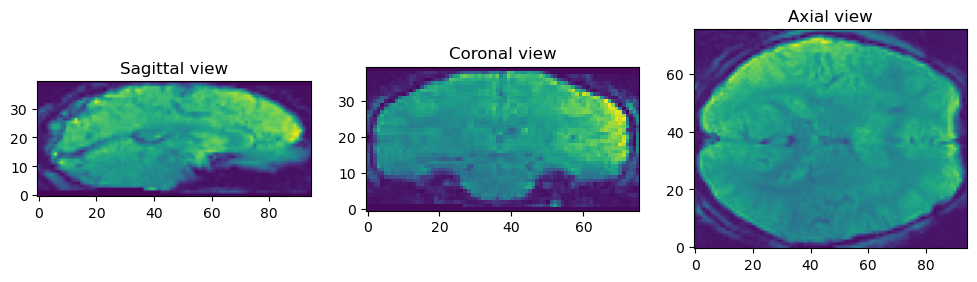

In [16]:
# Display sections of an image through the sagittal, coronal, and axial views, using the middle sections coordinates. 
display_fMRI_image(image_data, middle_coord)

In [17]:
# Load the mask using the NiBabel library, and display its size. 
mask_img = nib.load(fmriprep_data_path + subject + '/func/' +  subject + '_task-eegfmriNF_space-MNI152Lin_desc-brain_mask.nii.gz')
mask_img.shape

(76, 95, 40)

In [18]:
# Extract the image data, and display its size. 
mask_data = mask_img.get_fdata()
mask_data.shape

(76, 95, 40)

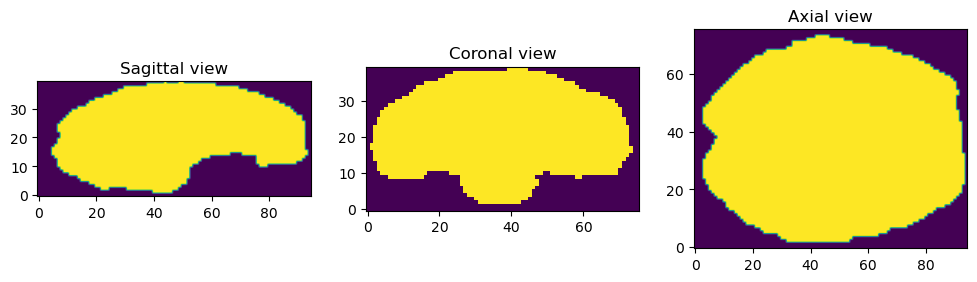

In [19]:
# Display sections of an image through the sagittal, coronal, and axial views, using the middle sections coordinates. 
display_fMRI_image(mask_data, middle_coord)

In [20]:
# Convert to Boolean. 
binary_mask_3d = mask_data.astype(bool)

# Convert the 3D binary mask into a 4D binary mask, by repeating the Boolean values along a 4th dimension. 
binary_mask_4d = np.repeat(binary_mask_3d[:, :, :, np.newaxis], nb_scans, axis = 3)
binary_mask_4d.shape

(76, 95, 40, 210)

In [21]:
# Transform the image data according to the binary mask. 
masked_image_data = image_data.copy()
masked_image_data[~binary_mask_4d] = np.nan
masked_image_data.shape

(76, 95, 40, 210)

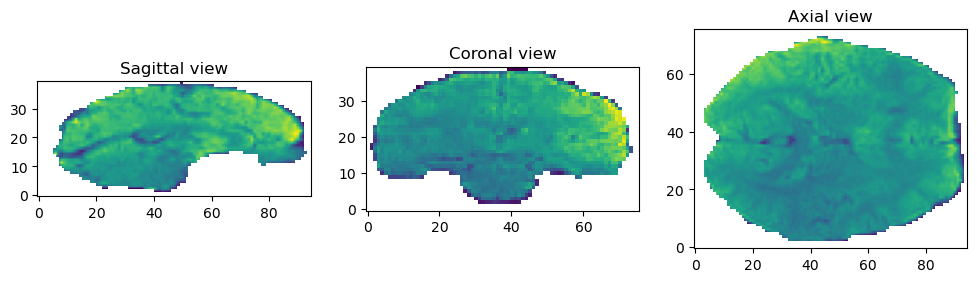

In [22]:
# Display sections of an image through the sagittal, coronal, and axial views, using the middle sections coordinates. 
display_fMRI_image(masked_image_data, middle_coord)

In [23]:
# Display the proportion of NaN values for all the scans. 
np.sum(np.isnan(masked_image_data)) / np.prod(masked_image_data.shape)

0.5643005540166205

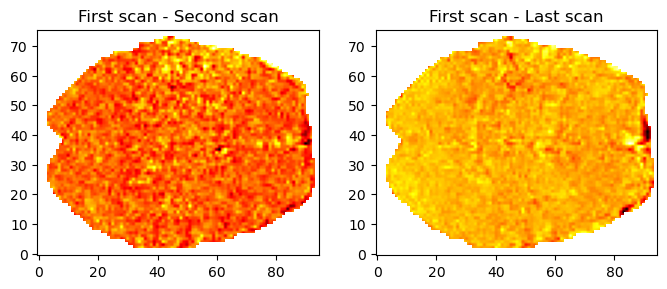

In [24]:
# Display the difference between the two first scans, and between the first and the last scans. 
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (8, 5))
axes[0].imshow(masked_image_data[:, :, middle_coord[2], 0] - masked_image_data[:, :, middle_coord[2], 1], 
           origin = 'lower', cmap = plt.get_cmap('hot'))
axes[0].set_title('First scan - Second scan')
axes[1].imshow(masked_image_data[:, :, middle_coord[2], 0] - masked_image_data[:, :, middle_coord[2], (nb_scans - 1)], 
           origin = 'lower', cmap = plt.get_cmap('hot'))
axes[1].set_title('First scan - Last scan');

## **2. Exploratory Data Analysis (EDA)**

- **Plots**: We explore the fMRI data at our disposal. In particular, we compare several brain images, and explore the distribution of voxel values between subjects, between conditions, and through the three neurological views, focusing on our three conditions of interest: eegNF, fmriNF, eegfmriNF. 

- **Normalization**: It is important to note that our arrays do not represent the brains of the different subjects in their true proportions, but rather a normalized version using the MNI template, which is a standardized brain model. In other words, the brain data of every subject was transformed by fMRIPrep into a standard space, in order to allow meaningful comparisons and statistics. One key implication of the normalization is that a (xi, yi, zi) voxel from one subject and one condition is comparable to a (xi, yi, zi) voxel of another subject or another condition. In other words, thanks to the normalization, we can compare our 3D images elementwise between several subjects or conditions. 

- **Observations**: At this level of analysis, our fMRI data seems consistent, with no obvious outlier. Nevertheless, we notice that the eegNF run is slightly shorter for subject sub-xp101, and missing for subject sub-xp102. 

In [25]:
# Define a function to extract the masked image data for a particular subject, condition, and scan. 
def extract_masked_image_data(subject, condition, scan = 0):
    
    # Load the mask, extract the mask data, and convert to Boolean. 
    mask_img = nib.load(fmriprep_data_path + subject + '/func/' + subject + '_task-' + condition + '_space-MNI152Lin_desc-brain_mask.nii.gz')
    mask_data = mask_img.get_fdata()
    binary_mask_3d = mask_data.astype(bool)
    
    # Load an image, extract the image data, select a scan, and apply the mask. 
    img = nib.load(fmriprep_data_path + subject + '/func/' + subject + '_task-' + condition + '_space-MNI152Lin_desc-preproc_bold.nii.gz')
    image_data = img.get_fdata()
    masked_image_data = image_data[:, :, :, scan]
    masked_image_data[~binary_mask_3d] = np.nan

    # Return the masked image data. 
    return masked_image_data

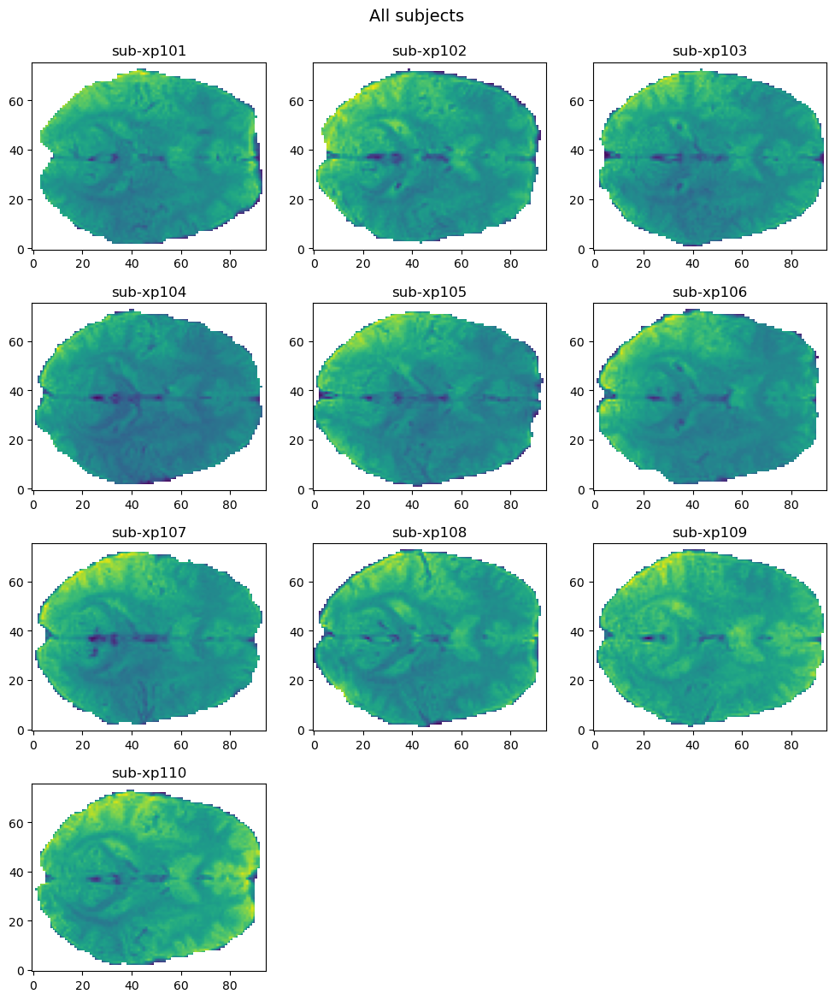

In [26]:
# Compare the 3D images between all subjects. 
fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (12, 14))
fig.suptitle('All subjects', fontsize = 14, y = 0.92)
subject_index = 0

# Iterate through all subjects. 
for subject in subjects:

    # Extract the masked image data for the eegfmriNF condition and the first scan. 
    masked_image_data = extract_masked_image_data(subject, 'eegfmriNF')
    
    # Compute the row and column indexes. 
    row_index = subject_index // 3
    column_index = subject_index % 3
    
    # Display sections of an image through the axial view, using the middle sections coordinates. 
    axes[row_index, column_index].imshow(masked_image_data[:, :, middle_coord[2]], origin = 'lower')
    axes[row_index, column_index].set_title(subject);
    
    # Increment. 
    subject_index += 1

# Hide empty subplots. 
axes[3, 1].set_visible(False)
axes[3, 2].set_visible(False)

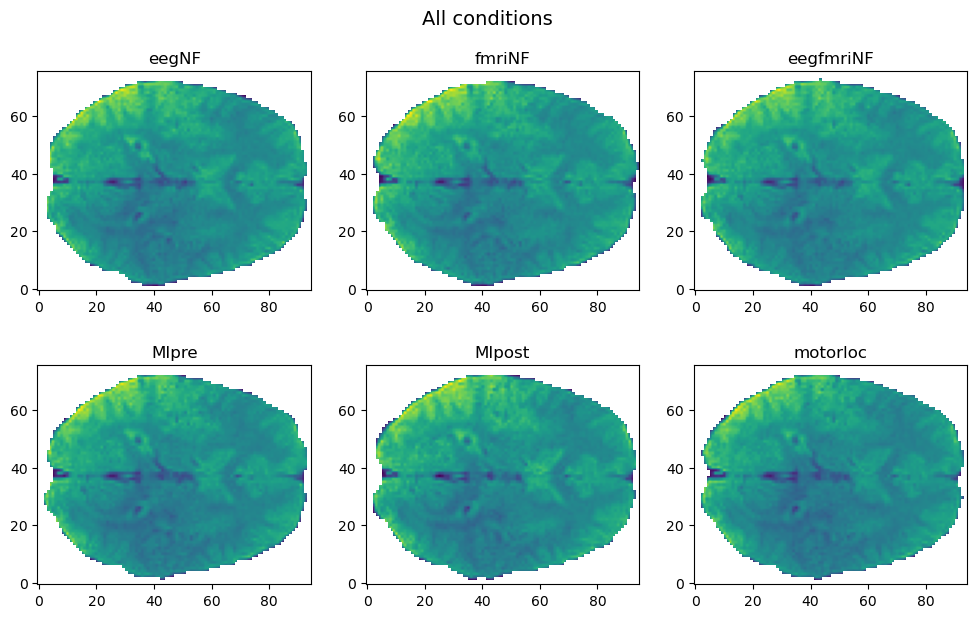

In [27]:
# Compare the 3D images for the same subject between all conditions. 
fig, axes = plt.subplots(nrows = 2, ncols = 3, figsize = (12, 7))
fig.suptitle('All conditions', fontsize = 14, y = 0.95)
condition_index = 0

# Iterate through all conditions. 
for condition in ['eegNF', 'fmriNF', 'eegfmriNF', 'MIpre', 'MIpost', 'motorloc']:

    # Extract the masked image data for the third subject (for the first subject, MIpre and MIpost are missing) and the first scan. 
    masked_image_data = extract_masked_image_data('sub-xp103', condition)
    
    # Compute the row and column indexes. 
    row_index = condition_index // 3
    column_index = condition_index % 3
    
    # Display sections of an image through the axial view, using the middle sections coordinates. 
    axes[row_index, column_index].imshow(masked_image_data[:, :, middle_coord[2]], origin = 'lower')
    axes[row_index, column_index].set_title(condition);
    
    # Increment. 
    condition_index += 1

In [28]:
# Load the brain images of interest and store them in dictionaries. 
dict_image_data = dict()
dict_masked_image_data = dict()
df_summary = pd.DataFrame()

# Iterate through all subjects. 
for subject in subjects:

    # Define the subject dictionaries. 
    dict_image_data[subject] = dict()
    dict_masked_image_data[subject] = dict()

    # Iterate through all conditions. 
    for condition in ['eegNF', 'fmriNF', 'eegfmriNF']:

        # Skip the current iteration for sub-xp102 and eegNF, since that run is missing. 
        if subject == 'sub-xp102' and condition == 'eegNF':
            df_summary.loc[subject, condition] = 'Missing'
            continue

        # Load the mask, extract the mask data, and convert to Boolean. 
        mask_img = nib.load(fmriprep_data_path + subject + '/func/' + subject + '_task-' + condition + '_space-MNI152Lin_desc-brain_mask.nii.gz')
        mask_data = mask_img.get_fdata()
        binary_mask_3d = mask_data.astype(bool)
        
        # Load an image, extract the image data, store the shape in the DataFrame, select the first scan, and apply the mask. 
        img = nib.load(fmriprep_data_path + subject + '/func/' + subject + '_task-' + condition + '_space-MNI152Lin_desc-preproc_bold.nii.gz')
        image_data = img.get_fdata()
        df_summary.loc[subject, condition] = str(image_data.shape)
        masked_image_data = image_data[:, :, :, 0].copy()
        masked_image_data[~binary_mask_3d] = np.nan

        # Store the images. 
        dict_image_data[subject][condition] = image_data[:, :, :, 0]
        dict_masked_image_data[subject][condition] = masked_image_data

In [29]:
# Display the summary DataFrame. 
df_summary

,eegNF,fmriNF,eegfmriNF
sub-xp101,"(76, 95, 40, 205)","(76, 95, 40, 210)","(76, 95, 40, 210)"
sub-xp102,Missing,"(76, 95, 40, 210)","(76, 95, 40, 210)"
sub-xp103,"(76, 95, 40, 210)","(76, 95, 40, 210)","(76, 95, 40, 210)"
sub-xp104,"(76, 95, 40, 210)","(76, 95, 40, 210)","(76, 95, 40, 210)"
sub-xp105,"(76, 95, 40, 210)","(76, 95, 40, 210)","(76, 95, 40, 210)"
sub-xp106,"(76, 95, 40, 210)","(76, 95, 40, 210)","(76, 95, 40, 210)"
sub-xp107,"(76, 95, 40, 210)","(76, 95, 40, 210)","(76, 95, 40, 210)"
sub-xp108,"(76, 95, 40, 210)","(76, 95, 40, 210)","(76, 95, 40, 210)"
sub-xp109,"(76, 95, 40, 210)","(76, 95, 40, 210)","(76, 95, 40, 210)"
sub-xp110,"(76, 95, 40, 210)","(76, 95, 40, 210)","(76, 95, 40, 210)"


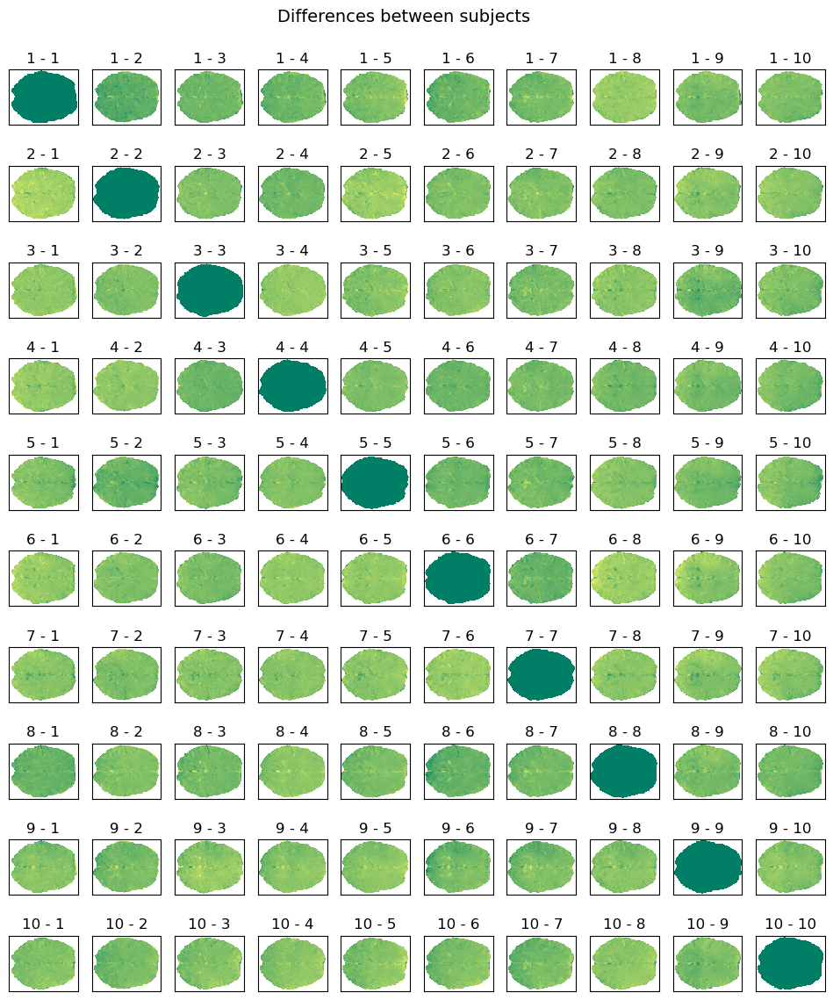

In [30]:
# Display the differences between subjects. 
fig, axes = plt.subplots(nrows = 10, ncols = 10, figsize = (12, 14))
fig.suptitle('Differences between subjects', fontsize = 14, y = 0.92)
subject_x_index = 0

# Iterate through all subjects. 
for subject_x in subjects:
    subject_y_index = 0

    # Iterate through all subjects. 
    for subject_y in subjects:
    
        # Retrieve the masked image data for the first scan. 
        masked_image_data_x = dict_masked_image_data[subject_x]['eegfmriNF']
        masked_image_data_y = dict_masked_image_data[subject_y]['eegfmriNF']

        # Display the differences between the two masked images. 
        axes[subject_x_index, subject_y_index].imshow(masked_image_data_x[:, :, middle_coord[2]] - masked_image_data_y[:, :, middle_coord[2]], 
                                               origin = 'lower', cmap = plt.get_cmap('summer'))
        axes[subject_x_index, subject_y_index].set_title(str(subject_x_index + 1) + ' - ' + str(subject_y_index + 1))
        axes[subject_x_index, subject_y_index].tick_params(left = False, right = False, labelleft = False, 
                                               labelbottom = False, bottom = False) 

        # Increment the subject index. 
        subject_y_index += 1

    # Increment the subject index. 
    subject_x_index += 1

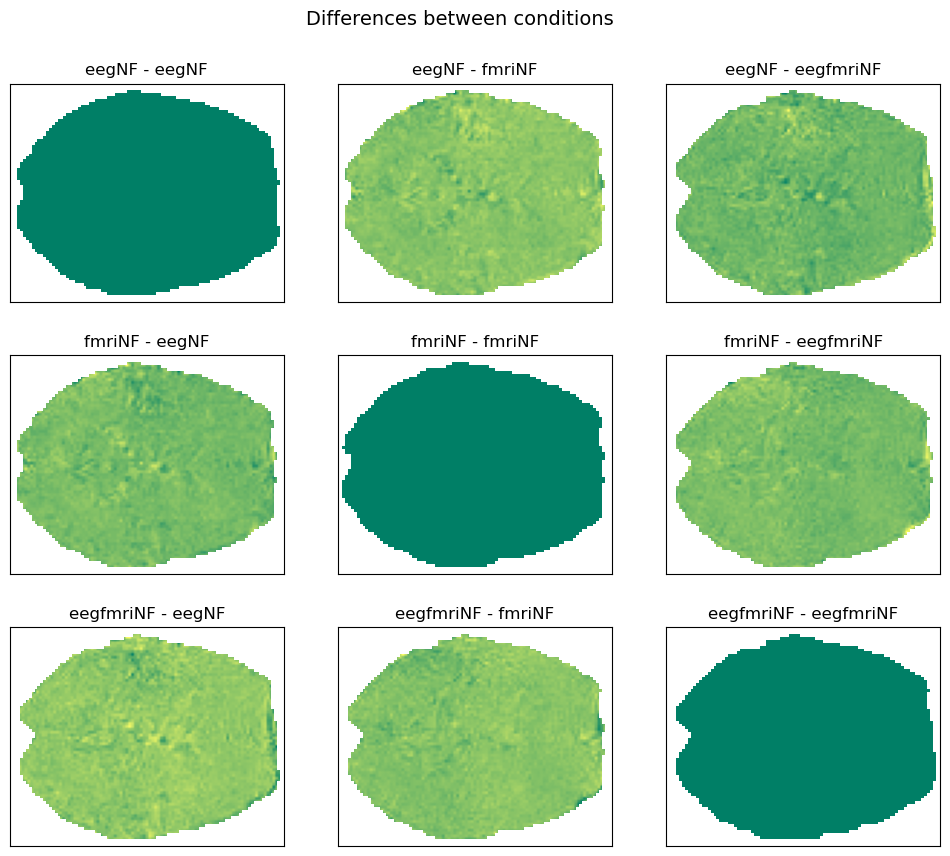

In [31]:
# Display the differences between conditions. 
fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (12, 10))
fig.suptitle('Differences between conditions', fontsize = 14, y = 0.95)
condition_x_index = 0

# Iterate through all conditions. 
for condition_x in ['eegNF', 'fmriNF', 'eegfmriNF']:
    condition_y_index = 0

    # Iterate through all conditions. 
    for condition_y in ['eegNF', 'fmriNF', 'eegfmriNF']:
    
        # Retrieve the masked image data for the first scan. 
        masked_image_data_x = dict_masked_image_data['sub-xp101'][condition_x]
        masked_image_data_y = dict_masked_image_data['sub-xp101'][condition_y]

        # Display the differences between the two masked images. 
        axes[condition_x_index, condition_y_index].imshow(masked_image_data_x[:, :, middle_coord[2]] - masked_image_data_y[:, :, middle_coord[2]], 
                                                   origin = 'lower', cmap = plt.get_cmap('summer'))
        axes[condition_x_index, condition_y_index].set_title(condition_x + ' - ' + condition_y)
        axes[condition_x_index, condition_y_index].tick_params(left = False, right = False, labelleft = False, 
                                                   labelbottom = False, bottom = False) 

        # Increment the subject index. 
        condition_y_index += 1

    # Increment the subject index. 
    condition_x_index += 1

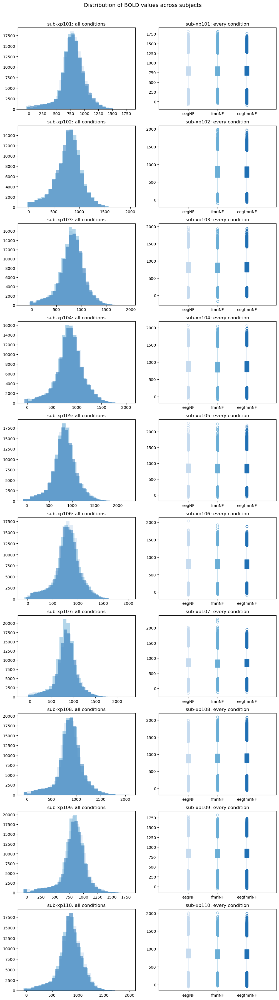

In [32]:
# Display histograms and boxplots, differentiating by subject. 
fig, axes = plt.subplots(nrows = 10, ncols = 2, figsize = (12, 45))
fig.suptitle('Distribution of BOLD values across subjects', fontsize = 14, y = 0.9)
subject_index = 0

# Iterate through all subjects. 
for subject in subjects:
    condition_index = 0 

    # Iterate through all conditions. 
    for condition in ['eegNF', 'fmriNF', 'eegfmriNF']:

        # Skip the current iteration for sub-xp102 and eegNF, since that run is missing. 
        if subject == 'sub-xp102' and condition == 'eegNF':
            condition_index += 1
            continue

        # Retrieve the masked image data for the first scan. 
        masked_image_data = dict_masked_image_data[subject][condition]
        
        # Flatten the image and remove the NaN values. 
        flatten_image = masked_image_data.flatten()
        flatten_image = flatten_image[~np.isnan(flatten_image)]
        
        # Define colormap and select a color for the condition. 
        cm = plt.colormaps['Blues']
        c = cm(0.25 * condition_index + 0.25)
        
        # Display the data and set titles. 
        axes[subject_index, 0].hist(flatten_image, bins = 30, alpha = 0.5, color = c)
        axes[subject_index, 0].set_title(subject + ': all conditions')
        
        axes[subject_index, 1].boxplot(flatten_image, positions = [condition_index + 1], patch_artist = True,
            boxprops = dict(facecolor = c, color = c),
            capprops = dict(color = c),
            whiskerprops = dict(color = c),
            flierprops = dict(color = c, markeredgecolor = c),
            medianprops = dict(color = c),
            )
        axes[subject_index, 1].set_xlim(0, 4)
        axes[subject_index, 1].set_xticks([1, 2, 3])
        axes[subject_index, 1].set_xticklabels(['eegNF', 'fmriNF', 'eegfmriNF'])
        axes[subject_index, 1].set_title(subject + ': every condition')

        # Increment the condition index. 
        condition_index += 1

    # Increment the subject index. 
    subject_index += 1

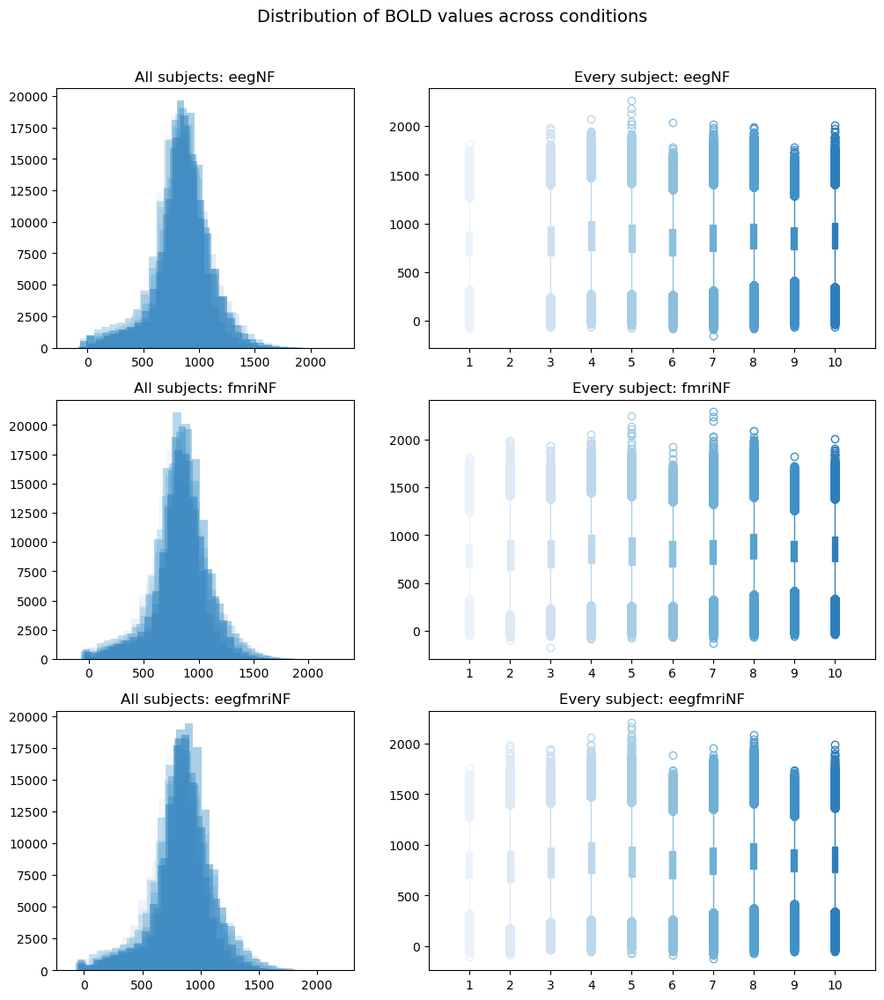

In [33]:
# Display histograms and boxplots, differentiating by condition. 
fig, axes = plt.subplots(nrows = 3, ncols = 2, figsize = (12, 13), gridspec_kw = {'width_ratios': [1, 1.5]})
fig.suptitle('Distribution of BOLD values across conditions', fontsize = 14, y = 0.95)
subject_index = 0

# Iterate through all subjects. 
for subject in subjects:
    condition_index = 0
    
    # Iterate through all conditions. 
    for condition in ['eegNF', 'fmriNF', 'eegfmriNF']:
        
        # Skip the current iteration for sub-xp102 and eegNF, since that run is missing. 
        if subject == 'sub-xp102' and condition == 'eegNF':
            condition_index += 1
            continue
        
        # Retrieve the masked image data for the first scan. 
        masked_image_data = dict_masked_image_data[subject][condition]
        
        # Flatten the image and remove the NaN values. 
        flatten_image = masked_image_data.flatten()
        flatten_image = flatten_image[~np.isnan(flatten_image)]
        
        # Define colormap and select a color for the subject. 
        cm = plt.colormaps['Blues']
        c = cm(0.07 * subject_index + 0.07)
        
        # Display the data and set titles. 
        axes[condition_index, 0].hist(flatten_image, bins = 30, alpha = 0.5, color = c)
        axes[condition_index, 0].set_title('All subjects: ' + condition)
        
        axes[condition_index, 1].boxplot(flatten_image, positions = [subject_index + 1], patch_artist = True,
            boxprops = dict(facecolor = c, color = c),
            capprops = dict(color = c),
            whiskerprops = dict(color = c),
            flierprops = dict(color = c, markeredgecolor = c),
            medianprops = dict(color = c),
            )
        axes[condition_index, 1].set_xlim(0, 11)
        axes[condition_index, 1].set_xticks(list(range(1, 11)))
        axes[condition_index, 1].set_xticklabels(range(1, 11))
        axes[condition_index, 1].set_title('Every subject: ' + condition)
        
        # Increment the condition index. 
        condition_index += 1

    # Increment the subject index. 
    subject_index += 1

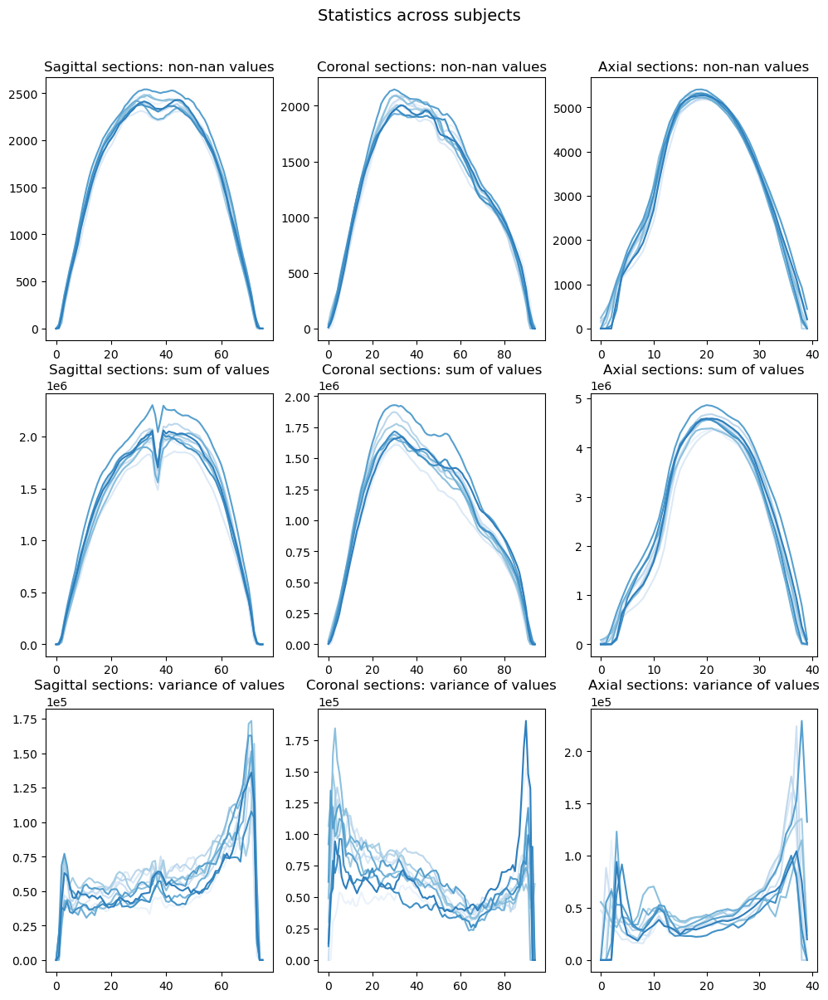

In [34]:
# Display statistics through the three neurological views, corresponding to the same condition on several subjects. 
fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (12, 14))
fig.suptitle('Statistics across subjects', fontsize = 14, y = 0.94)
subject_index = 0

# Iterate through all subjects. 
for subject in subjects:
    
    # Retrieve the masked image data for the first scan. 
    masked_image_data = dict_masked_image_data[subject]['eegfmriNF']
    
    # Sagittal view. 
    sagittal_nonnan_value = []
    sagittal_sum_value = []
    sagittal_var_value = []
    for sagittal_index in range(0, masked_image_data.shape[0]):
        sagittal_nonnan_value.append(np.sum(~np.isnan(masked_image_data[sagittal_index, :, :])))
        sagittal_sum_value.append(np.nansum(masked_image_data[sagittal_index, :, :]))
        # Compute the variance only when the sum is different from zero. 
        if sagittal_sum_value[-1] != 0:
            sagittal_var_value.append(np.nanvar(masked_image_data[sagittal_index, :, :]))
        else:
            sagittal_var_value.append(0)
        
    # Coronal view. 
    coronal_nonnan_value = []
    coronal_sum_value = []
    coronal_var_value = []
    for coronal_index in range(0, masked_image_data.shape[1]):
        coronal_nonnan_value.append(np.sum(~np.isnan(masked_image_data[:, coronal_index, :])))
        coronal_sum_value.append(np.nansum(masked_image_data[:, coronal_index, :]))
        # Compute the variance only when the sum is different from zero. 
        if coronal_sum_value[-1] != 0:
            coronal_var_value.append(np.nanvar(masked_image_data[:, coronal_index, :]))
        else:
            coronal_var_value.append(0)
        
    # Axial view. 
    axial_nonnan_value = []
    axial_sum_value = []
    axial_var_value = []
    for axial_index in range(0, masked_image_data.shape[2]):
        axial_nonnan_value.append(np.sum(~np.isnan(masked_image_data[:, :, axial_index])))
        axial_sum_value.append(np.nansum(masked_image_data[:, :, axial_index]))
        # Compute the variance only when the sum is different from zero. 
        if axial_sum_value[-1] != 0:
            axial_var_value.append(np.nanvar(masked_image_data[:, :, axial_index]))
        else:
            axial_var_value.append(0)
        
    # Define colormap and select a color for the subject. 
    cm = plt.colormaps['Blues']
    c = cm(0.07 * subject_index + 0.07)
        
    # Display the data. 
    axes[0, 0].plot(sagittal_nonnan_value, color = c)
    axes[0, 1].plot(coronal_nonnan_value, color = c)
    axes[0, 2].plot(axial_nonnan_value, color = c)
    axes[1, 0].plot(sagittal_sum_value, color = c)
    axes[1, 1].plot(coronal_sum_value, color = c)
    axes[1, 2].plot(axial_sum_value, color = c)
    axes[2, 0].plot(sagittal_var_value, color = c)
    axes[2, 1].plot(coronal_var_value, color = c)
    axes[2, 2].plot(axial_var_value, color = c)

    # Use scientific notation for the variance graphs. 
    axes[2, 0].ticklabel_format(axis = 'y', style = 'sci', scilimits = (0, 0))
    axes[2, 1].ticklabel_format(axis = 'y', style = 'sci', scilimits = (0, 0))
    axes[2, 2].ticklabel_format(axis = 'y', style = 'sci', scilimits = (0, 0))
    
    # Set titles. 
    axes[0, 0].set_title('Sagittal sections: non-nan values')
    axes[0, 1].set_title('Coronal sections: non-nan values')
    axes[0, 2].set_title('Axial sections: non-nan values')
    axes[1, 0].set_title('Sagittal sections: sum of values')
    axes[1, 1].set_title('Coronal sections: sum of values')
    axes[1, 2].set_title('Axial sections: sum of values')
    axes[2, 0].set_title('Sagittal sections: variance of values')
    axes[2, 1].set_title('Coronal sections: variance of values')
    axes[2, 2].set_title('Axial sections: variance of values')

    # Increment the subject index. 
    subject_index += 1

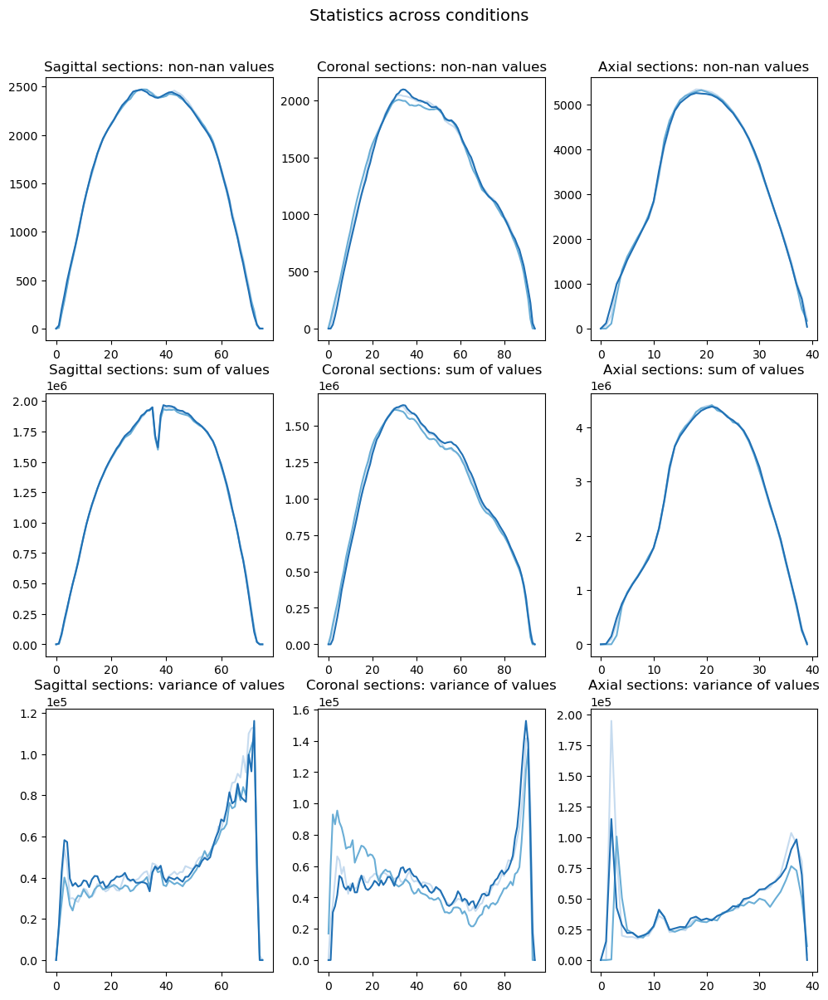

In [35]:
# Display statistics through the three neurological views, corresponding to several conditions on the same subject. 
fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (12, 14))
fig.suptitle('Statistics across conditions', fontsize = 14, y = 0.94)
condition_index = 0

# Iterate through all conditions. 
for condition in ['eegNF', 'fmriNF', 'eegfmriNF']:
    
    # Retrieve the masked image data for the first scan. 
    masked_image_data = dict_masked_image_data['sub-xp101'][condition]
    
    # Sagittal view. 
    sagittal_nonnan_value = []
    sagittal_sum_value = []
    sagittal_var_value = []
    for sagittal_index in range(0, masked_image_data.shape[0]):
        sagittal_nonnan_value.append(np.sum(~np.isnan(masked_image_data[sagittal_index, :, :])))
        sagittal_sum_value.append(np.nansum(masked_image_data[sagittal_index, :, :]))
        # Compute the variance only when the sum is different from zero. 
        if sagittal_sum_value[-1] != 0:
            sagittal_var_value.append(np.nanvar(masked_image_data[sagittal_index, :, :]))
        else:
            sagittal_var_value.append(0)
        
    # Coronal view. 
    coronal_nonnan_value = []
    coronal_sum_value = []
    coronal_var_value = []
    for coronal_index in range(0, masked_image_data.shape[1]):
        coronal_nonnan_value.append(np.sum(~np.isnan(masked_image_data[:, coronal_index, :])))
        coronal_sum_value.append(np.nansum(masked_image_data[:, coronal_index, :]))
        # Compute the variance only when the sum is different from zero. 
        if coronal_sum_value[-1] != 0:
            coronal_var_value.append(np.nanvar(masked_image_data[:, coronal_index, :]))
        else:
            coronal_var_value.append(0)
        
    # Axial view. 
    axial_nonnan_value = []
    axial_sum_value = []
    axial_var_value = []
    for axial_index in range(0, masked_image_data.shape[2]):
        axial_nonnan_value.append(np.sum(~np.isnan(masked_image_data[:, :, axial_index])))
        axial_sum_value.append(np.nansum(masked_image_data[:, :, axial_index]))
        # Compute the variance only when the sum is different from zero. 
        if axial_sum_value[-1] != 0:
            axial_var_value.append(np.nanvar(masked_image_data[:, :, axial_index]))
        else:
            axial_var_value.append(0)
        
    # Define colormap and select a color for the subject. 
    cm = plt.colormaps['Blues']
    c = cm(0.25 * condition_index + 0.25)
        
    # Display the data. 
    axes[0, 0].plot(sagittal_nonnan_value, color = c)
    axes[0, 1].plot(coronal_nonnan_value, color = c)
    axes[0, 2].plot(axial_nonnan_value, color = c)
    axes[1, 0].plot(sagittal_sum_value, color = c)
    axes[1, 1].plot(coronal_sum_value, color = c)
    axes[1, 2].plot(axial_sum_value, color = c)
    axes[2, 0].plot(sagittal_var_value, color = c)
    axes[2, 1].plot(coronal_var_value, color = c)
    axes[2, 2].plot(axial_var_value, color = c)

    # Use scientific notation for the variance graphs. 
    axes[2, 0].ticklabel_format(axis = 'y', style = 'sci', scilimits = (0, 0))
    axes[2, 1].ticklabel_format(axis = 'y', style = 'sci', scilimits = (0, 0))
    axes[2, 2].ticklabel_format(axis = 'y', style = 'sci', scilimits = (0, 0))
    
    # Set titles. 
    axes[0, 0].set_title('Sagittal sections: non-nan values')
    axes[0, 1].set_title('Coronal sections: non-nan values')
    axes[0, 2].set_title('Axial sections: non-nan values')
    axes[1, 0].set_title('Sagittal sections: sum of values')
    axes[1, 1].set_title('Coronal sections: sum of values')
    axes[1, 2].set_title('Axial sections: sum of values')
    axes[2, 0].set_title('Sagittal sections: variance of values')
    axes[2, 1].set_title('Coronal sections: variance of values')
    axes[2, 2].set_title('Axial sections: variance of values')

    # Increment the condition index. 
    condition_index += 1

## **3. Targets Extraction**

- **Targets**: We define the MNI coordinates of our target voxels based on the Science 2014 article (neuropolis/README.md), and transform these MNI coordinates into the actual positions of the voxels inside the array, by using the inverse of the affine matrix. Then, we define the number of scans of interest, and extract the target voxels values for each of these scans. More precisely, we compute the mean value of a 27-voxel cluster, i.e., a 3x3x3 cube including the peak voxel and the 26 adjacent voxels. Some target voxels, in particular the one from the ventral striatum, can be located outside the fMRIPrep brain mask for some subjects. 

In [36]:
# Store the target voxels MNI coordinates in a dictionary. 
dict_targets_MNI_coordinates = dict()
dict_targets_MNI_coordinates['pgACC'] = [-12, 52, 16]
dict_targets_MNI_coordinates['vmPFC'] = [-8, 44, -12]
dict_targets_MNI_coordinates['Right FPC 1'] = [32, 56, 12]
dict_targets_MNI_coordinates['Right FPC 2'] = [28, 44, 6]
dict_targets_MNI_coordinates['Right FPC 3'] = [36, 48, -4]
dict_targets_MNI_coordinates['dACC 1'] = [-4, 28, 36]
dict_targets_MNI_coordinates['dACC 2'] = [12, 16, 48]
dict_targets_MNI_coordinates['Left post-LPC'] = [-48, 0, 28]
dict_targets_MNI_coordinates['Right post-LPC'] = [52, 16, 28]
dict_targets_MNI_coordinates['Left PMC 1'] = [-12, 4, 64]
dict_targets_MNI_coordinates['Left PMC 2'] = [-24, 0, 64]
dict_targets_MNI_coordinates['Left dorsal striatum'] = [-20, 16, 4]
dict_targets_MNI_coordinates['Right dorsal striatum'] = [12, 4, 16]
dict_targets_MNI_coordinates['Left FPC'] = [-28, 52, 20]
dict_targets_MNI_coordinates['Right FPC'] = [28, 52, 20]
dict_targets_MNI_coordinates['Left mid-LPC'] = [-48, 20, 28]
dict_targets_MNI_coordinates['Right ventral striatum'] = [12, 16, -16]

# Display the number of target voxels. 
len(dict_targets_MNI_coordinates)

17

In [37]:
# Define a function to display the position of a voxel, with one image as background. 
def display_voxel_position(voxel_index, background_image, figure_title = ''):
    fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (12, 4))
    fig.suptitle(figure_title, fontsize = 14, y = 0.85)

    # Sagittal view. 
    axes[0].imshow(background_image[voxel_index[0], :, :].T, origin = 'lower')
    axes[0].axhline(voxel_index[2], 0, background_image.shape[1], color = 'yellow') # Horizontal line through coronal view. 
    axes[0].axvline(voxel_index[1], 0, background_image.shape[2], color = 'yellow') # Vertical line through axial view. 
    axes[0].scatter(voxel_index[1], voxel_index[2], marker = 'o', c = 'white')
    axes[0].set_title('Sagittal view')

    # Coronal view. 
    axes[1].imshow(background_image[:, voxel_index[1], :].T, origin = 'lower')
    axes[1].axhline(voxel_index[2], 0, background_image.shape[0], color = 'yellow') # Horizontal line through sagittal view. 
    axes[1].axvline(voxel_index[0], 0, background_image.shape[2], color = 'yellow') # Vertical line through axial view. 
    axes[1].scatter(voxel_index[0], voxel_index[2], marker = 'o', c = 'white')
    axes[1].set_title('Coronal view')

    # Axial view. 
    axes[2].imshow(background_image[:, :, voxel_index[2]], origin = 'lower')
    axes[2].axhline(voxel_index[0], 0, background_image.shape[1], color = 'yellow') # Horizontal line through coronal view. 
    axes[2].axvline(voxel_index[1], 0, background_image.shape[0], color = 'yellow') # Vertical line through sagittal view. 
    axes[2].scatter(voxel_index[1], voxel_index[0], marker = 'o', c = 'white')
    axes[2].set_title('Axial view')
    plt.show();

In [38]:
# Define a function to compute the array position of a voxel from its MNI coordinates, by using the inverse of the affine matrix. 
def compute_array_position(voxel_MNI_coordinates, img):
    voxel_array_position = np.round(image.coord_transform(voxel_MNI_coordinates[0], 
                                                          voxel_MNI_coordinates[1], 
                                                          voxel_MNI_coordinates[2], 
                                                          np.linalg.inv(img.affine))).astype(int)
    return voxel_array_position

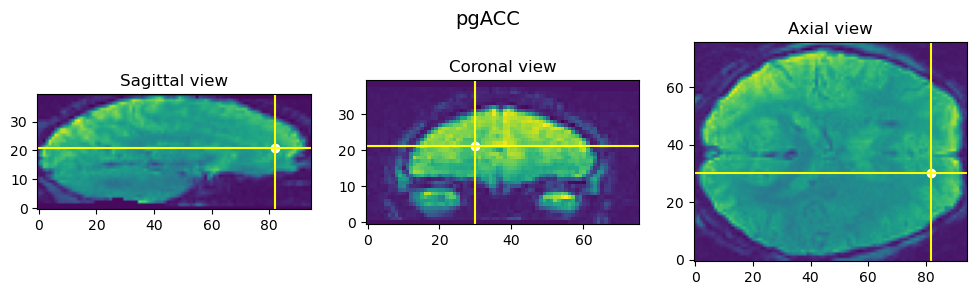

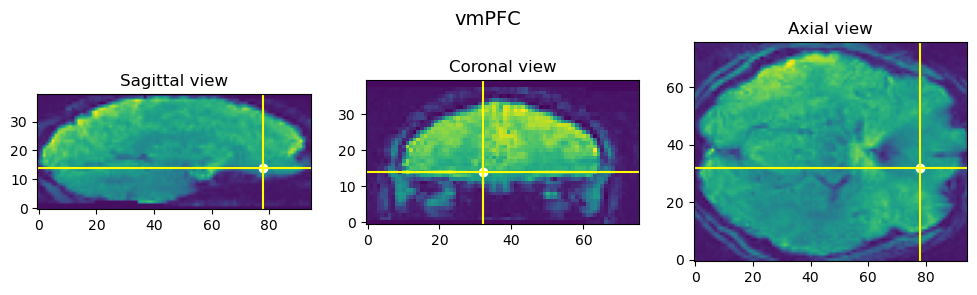

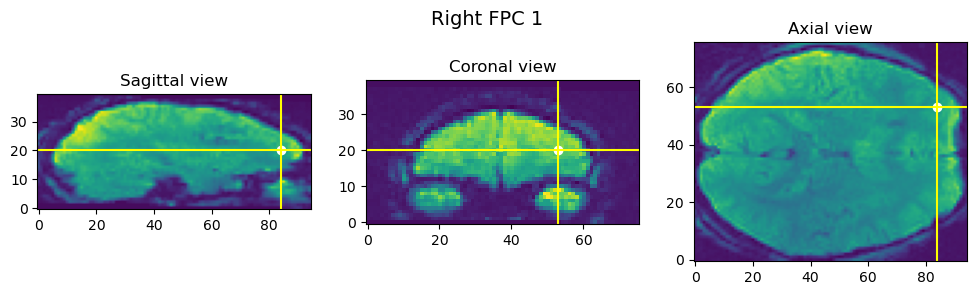

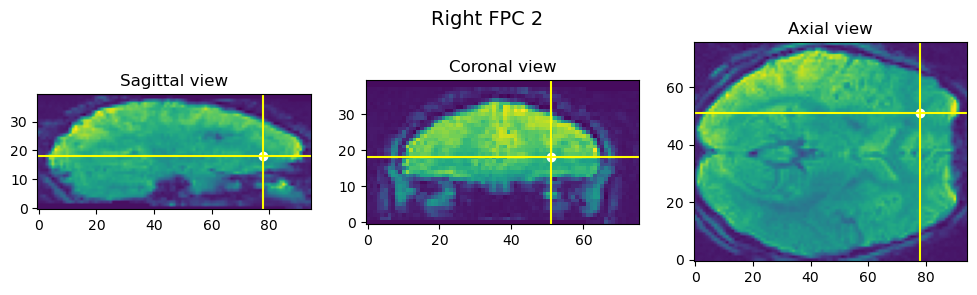

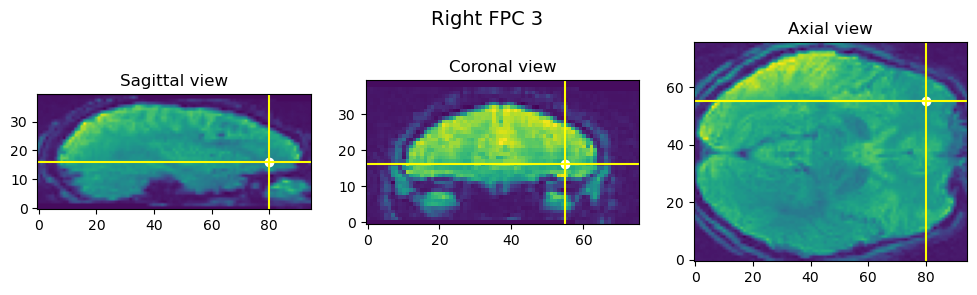

...

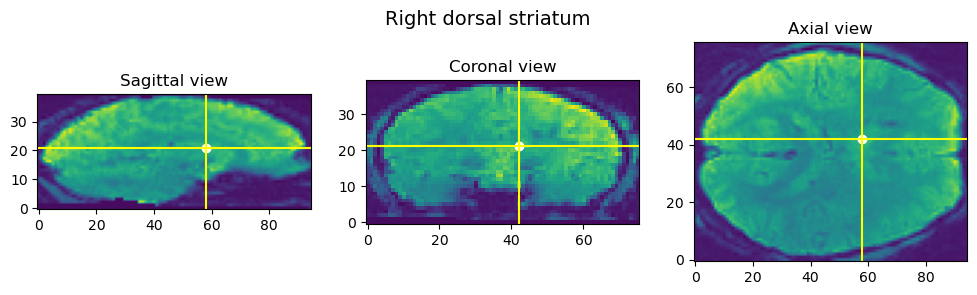

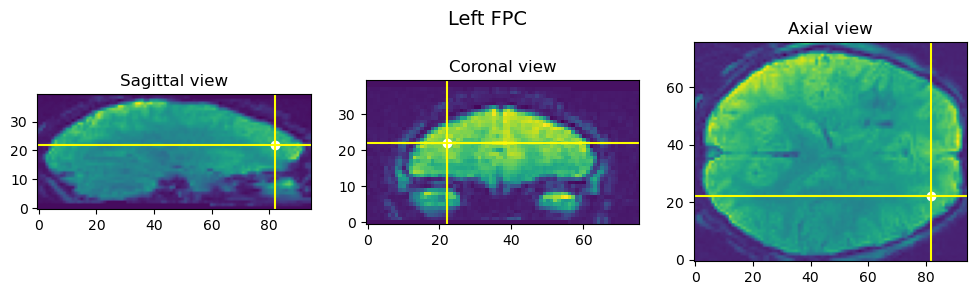

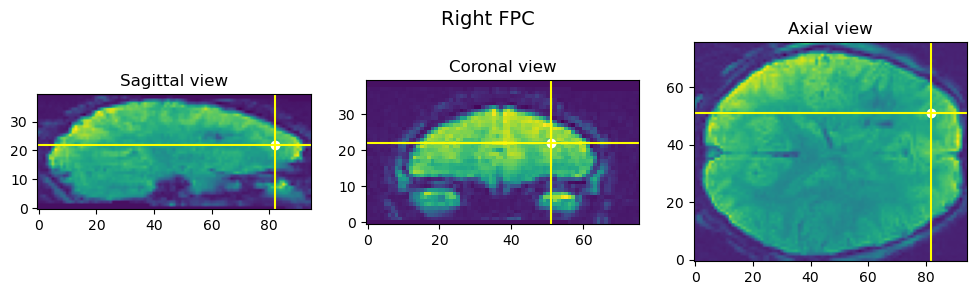

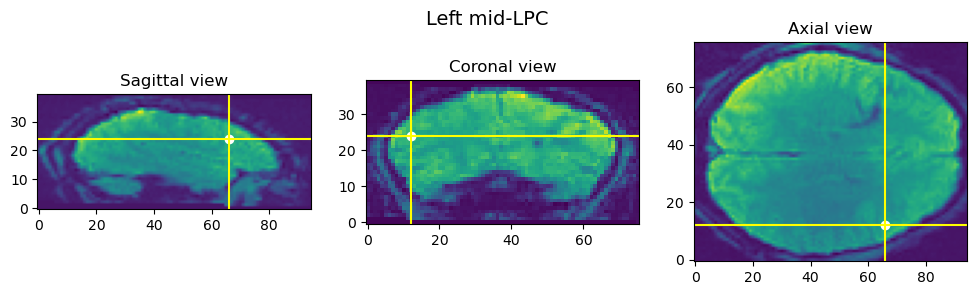

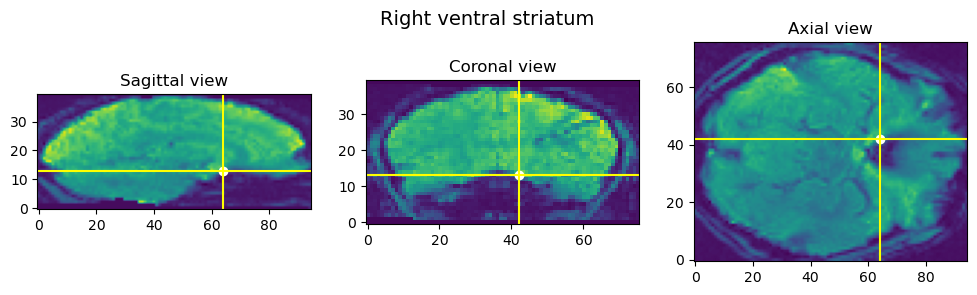

In [39]:
# Iterate through all target voxels positions. 
for target_voxel in dict_targets_MNI_coordinates.keys():

    # Transform the MNI coordinates into the array position, i.e., the position of the voxel inside the array. 
    target_voxel_array_position = compute_array_position(dict_targets_MNI_coordinates[target_voxel], img)
    
    # Retrieve an image data as the background. 
    background_image = dict_image_data['sub-xp101']['eegfmriNF']

    # Display the position of the target voxel. 
    display_voxel_position(target_voxel_array_position, background_image, figure_title = target_voxel)
    

In [40]:
# Define the number of scans and extract the target voxels values. 
nb_scans = 200
compute_mean_cluster = True # If True, for each voxel, compute the mean value of a 27-voxel cluster, including the peak voxel and the 26 adjacent voxels. 
dict_targets_values = dict()
dict_mean_values = dict()
dict_mean_values_inside_brain = dict()
dict_mean_values_outside_brain = dict()

# Iterate through all subjects. 
for subject in subjects:

    # Define the subject dictionaries. 
    dict_targets_values[subject] = dict()
    dict_mean_values[subject] = dict()
    dict_mean_values_inside_brain[subject] = dict()
    dict_mean_values_outside_brain[subject] = dict()

    # Iterate through all conditions. 
    for condition in ['eegNF', 'fmriNF', 'eegfmriNF']:

        # Skip the current iteration for sub-xp102 and eegNF, since that run is missing. 
        if subject == 'sub-xp102' and condition == 'eegNF':
            continue

        # Load the image and extract the image data. 
        img = nib.load(fmriprep_data_path + subject + '/func/' + subject + '_task-' + condition + '_space-MNI152Lin_desc-preproc_bold.nii.gz')
        image_data = img.get_fdata()

        # Discard the first scan, as indicated in the article describing the dataset, and take the nb_scans following scans. 
        image_data = image_data[:, :, :, 1:(nb_scans + 1)] 
        
        # Load the mask, extract the mask data, convert to Boolean, and convert the 3D binary mask into a 4D binary mask. 
        mask_img = nib.load(fmriprep_data_path + subject + '/func/' + subject + '_task-' + condition + '_space-MNI152Lin_desc-brain_mask.nii.gz')
        mask_data = mask_img.get_fdata()
        binary_mask_3d = mask_data.astype(bool)
        binary_mask_4d = np.repeat(binary_mask_3d[:, :, :, np.newaxis], nb_scans, axis = 3)

        # Apply both the normal mask and the inverted mask. 
        image_data_inside_brain = image_data.copy()
        image_data_inside_brain[~binary_mask_4d] = np.nan
        image_data_outside_brain = image_data.copy()
        image_data_outside_brain[binary_mask_4d] = np.nan

        # Store the mean image values. 
        dict_mean_values[subject][condition] = np.mean(image_data, axis = (0, 1, 2))
        dict_mean_values_inside_brain[subject][condition] = np.nanmean(image_data_inside_brain, axis = (0, 1, 2))
        dict_mean_values_outside_brain[subject][condition] = np.nanmean(image_data_outside_brain, axis = (0, 1, 2))

        # Define the condition dictionary. 
        dict_targets_values[subject][condition] = dict()

        # Iterate through all target voxels. 
        for target_voxel in dict_targets_MNI_coordinates.keys():

            # Transform the MNI coordinates into the array position, i.e., the position of the voxel inside the array. 
            target_voxel_array_position = compute_array_position(dict_targets_MNI_coordinates[target_voxel], img)

            # Extract the target voxel values. 
            if compute_mean_cluster:
                target_voxel_values = np.mean(image_data[(target_voxel_array_position[0] - 1):(target_voxel_array_position[0] + 1),
                                                         (target_voxel_array_position[1] - 1):(target_voxel_array_position[1] + 1),
                                                         (target_voxel_array_position[2] - 1):(target_voxel_array_position[2] + 1), :], 
                                                         axis = (0, 1, 2))
            else:
                target_voxel_values = image_data[target_voxel_array_position[0],
                                                 target_voxel_array_position[1],
                                                 target_voxel_array_position[2], :]
            
        
            # Store the target voxel values. 
            dict_targets_values[subject][condition][target_voxel] = target_voxel_values

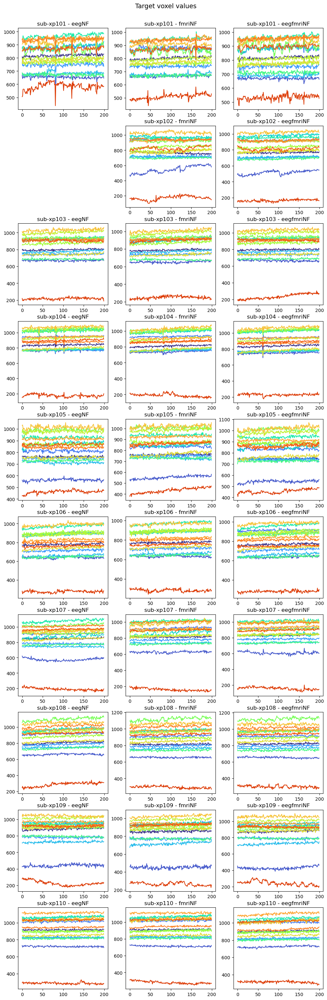

In [41]:
# Plot the target voxel values by subject and condition. 
fig, axes = plt.subplots(nrows = 10, ncols = 3, figsize = (12, 38))
fig.suptitle('Target voxel values', fontsize = 14, y = 0.9)
subject_index = 0

# Iterate through all subjects. 
for subject in subjects:
    condition_index = 0
    
    # Iterate through all conditions. 
    for condition in ['eegNF', 'fmriNF', 'eegfmriNF']:
        target_index = 0

        # Skip the current iteration for sub-xp102 and eegNF, since that run is missing. 
        if subject == 'sub-xp102' and condition == 'eegNF':
            axes[subject_index, condition_index].set_visible(False)
            condition_index += 1
            continue

        # Iterate through all target voxels. 
        for target_voxel in dict_targets_MNI_coordinates.keys():
            
            # Define colormap and select a color. 
            cm = plt.colormaps['turbo']
            c = cm(0.05 * target_index + 0.05)
    
            # Retrieve and plot the target voxel values. 
            target_voxel_values = dict_targets_values[subject][condition][target_voxel]
            axes[subject_index, condition_index].plot(target_voxel_values, color = c)
            axes[subject_index, condition_index].set_title(subject + ' - ' + condition)

            # Increment the target index. 
            target_index += 1

        # Increment the condition index. 
        condition_index += 1

    # Increment the subject index. 
    subject_index += 1

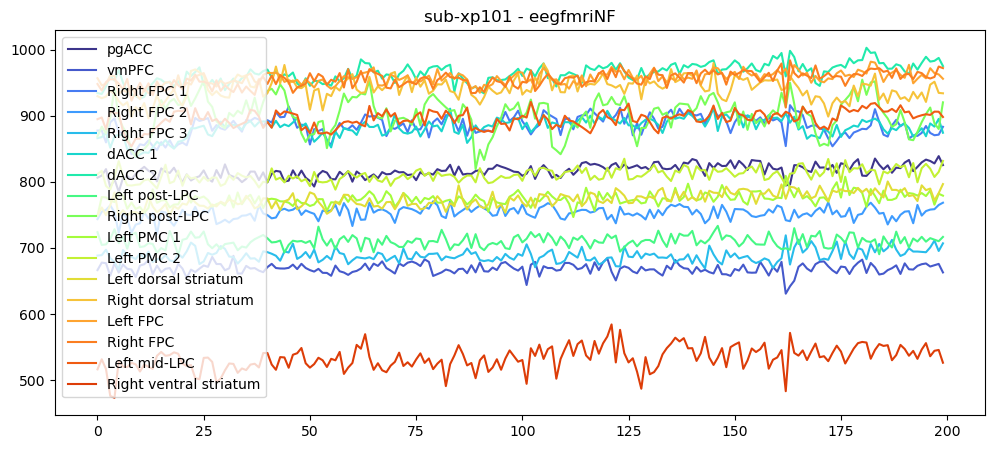

In [42]:
# Define an example subject and condition. 
subject = 'sub-xp101'
condition = 'eegfmriNF'

# Plot the target voxels values. 
plt.figure(figsize = (12, 5)) 
target_index = 0

# Iterate through all target voxels. 
for target_voxel in dict_targets_MNI_coordinates.keys():
    
    # Define colormap and select a color. 
    cm = plt.colormaps['turbo']
    c = cm(0.05 * target_index + 0.05)

    # Retrieve and plot the target voxel values. 
    target_voxel_values = dict_targets_values[subject][condition][target_voxel]
    plt.plot(target_voxel_values, color = c, label = target_voxel)
    plt.title(subject + ' - ' + condition)
    plt.legend()

    # Increment the target index. 
    target_index += 1

## **4. Target Engineering**

- **Normalization**: We explore the systematic biases in our fMRI data, and normalize our targets. We notice that the mean BOLD signal increases throughout each run, a common observation in fMRI datasets, and that this increase is higher for the voxels located inside the brain than outside the brain. Therefore, we start by computing a regression line representing the average increase of the BOLD signal inside the brain, and remove this effect from each target. Then, we normalize each of the targets, and replace the outliers (STD > 3) by the value of the previous scan. 

- **Next steps**: As the baseline for the machine learning and deep learning steps, we choose the mean value of the targets, which is now zero. We store all the relevant values in dictionaries, and save them in the preprocessing directory. 

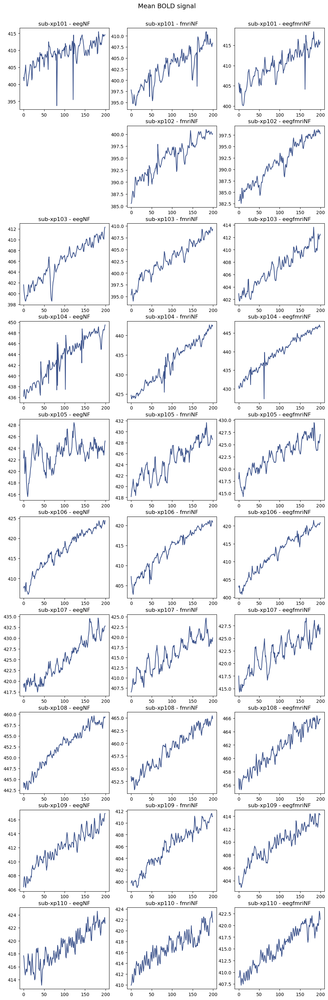

In [43]:
# Plot the mean values by subject and condition. 
fig, axes = plt.subplots(nrows = 10, ncols = 3, figsize = (12, 38))
fig.suptitle('Mean BOLD signal', fontsize = 14, y = 0.9)
subject_index = 0

# Iterate through all subjects. 
for subject in subjects:
    condition_index = 0
    
    # Iterate through all conditions. 
    for condition in ['eegNF', 'fmriNF', 'eegfmriNF']:

        # Skip the current iteration for sub-xp102 and eegNF, since that run is missing. 
        if subject == 'sub-xp102' and condition == 'eegNF':
            axes[subject_index, condition_index].set_visible(False)
            condition_index += 1
            continue

        # Define colormap. 
        cm = plt.colormaps['viridis']
            
        # Retrieve and plot the mean voxel values. 
        mean_values = dict_mean_values[subject][condition]
        axes[subject_index, condition_index].plot(mean_values, color = cm(0.25))
        axes[subject_index, condition_index].set_title(subject + ' - ' + condition)

        # Increment the condition index. 
        condition_index += 1

    # Increment the subject index. 
    subject_index += 1

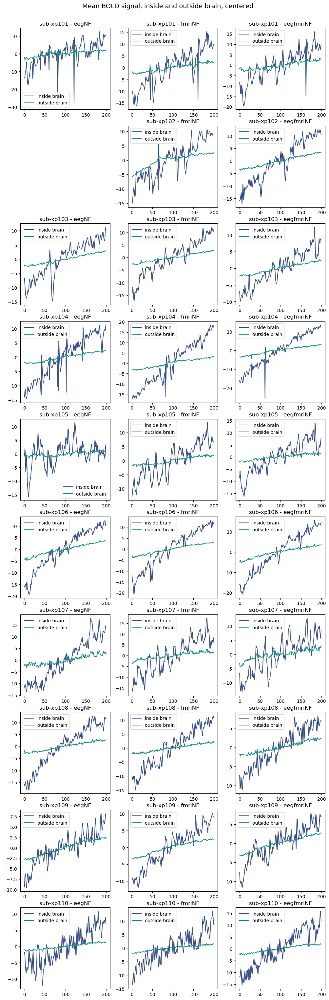

In [44]:
# Plot the mean values by subject and condition, for the voxels inside and outside the brain, centered. 
fig, axes = plt.subplots(nrows = 10, ncols = 3, figsize = (12, 38))
fig.suptitle('Mean BOLD signal, inside and outside brain, centered', fontsize = 14, y = 0.9)
subject_index = 0

# Iterate through all subjects. 
for subject in subjects:
    condition_index = 0
    
    # Iterate through all conditions. 
    for condition in ['eegNF', 'fmriNF', 'eegfmriNF']:

        # Skip the current iteration for sub-xp102 and eegNF, since that run is missing. 
        if subject == 'sub-xp102' and condition == 'eegNF':
            axes[subject_index, condition_index].set_visible(False)
            condition_index += 1
            continue

        # Define colormap. 
        cm = plt.colormaps['viridis']
            
        # Retrieve, center and plot the mean voxel values inside the brain. 
        mean_values_inside_brain = dict_mean_values_inside_brain[subject][condition]
        mean_values_inside_brain = mean_values_inside_brain - np.mean(mean_values_inside_brain)
        axes[subject_index, condition_index].plot(mean_values_inside_brain, color = cm(0.25), label = 'inside brain')

        # Retrieve, center and plot the mean voxel values outside the brain. 
        mean_values_outside_brain = dict_mean_values_outside_brain[subject][condition]
        mean_values_outside_brain = mean_values_outside_brain - np.mean(mean_values_outside_brain)
        axes[subject_index, condition_index].plot(mean_values_outside_brain, color = cm(0.5), label = 'outside brain')
        axes[subject_index, condition_index].set_title(subject + ' - ' + condition)
        axes[subject_index, condition_index].legend()

        # Increment the condition index. 
        condition_index += 1

    # Increment the subject index. 
    subject_index += 1
    

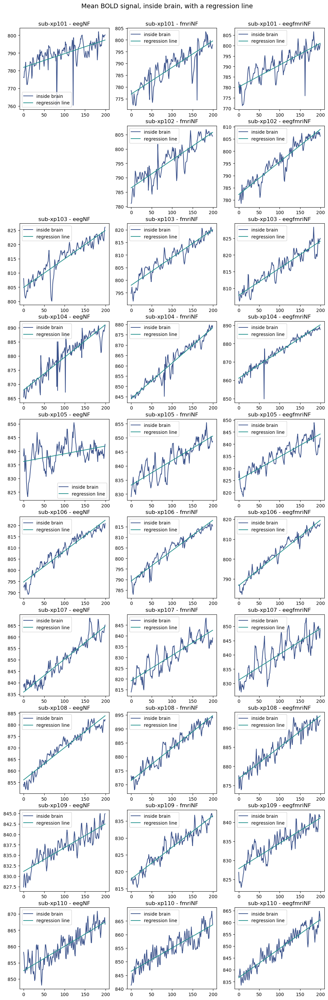

In [45]:
# Define a dictionary to store the regression coefficients. 
dict_regression_coefficients = dict()

# Plot the mean values by subject and condition, for the voxels inside the brain, with a regression line. 
fig, axes = plt.subplots(nrows = 10, ncols = 3, figsize = (12, 38))
fig.suptitle('Mean BOLD signal, inside brain, with a regression line', fontsize = 14, y = 0.9)
subject_index = 0

# Iterate through all subjects. 
for subject in subjects:
    condition_index = 0

    # Define the subject dictionary. 
    dict_regression_coefficients[subject] = dict()
    
    # Iterate through all conditions. 
    for condition in ['eegNF', 'fmriNF', 'eegfmriNF']:

        # Skip the current iteration for sub-xp102 and eegNF, since that run is missing. 
        if subject == 'sub-xp102' and condition == 'eegNF':
            axes[subject_index, condition_index].set_visible(False)
            condition_index += 1
            continue

        # Define colormap. 
        cm = plt.colormaps['viridis']
            
        # Retrieve and plot the mean voxel values inside the brain. 
        mean_values_inside_brain = dict_mean_values_inside_brain[subject][condition]
        axes[subject_index, condition_index].plot(mean_values_inside_brain, color = cm(0.25), label = 'inside brain')

        # Compute and plot the regression line. 
        x_values = range(mean_values_inside_brain.shape[0])
        coefficients = np.polyfit(x_values, mean_values_inside_brain, 1)
        y_values = coefficients[0] * x_values + coefficients[1]
        axes[subject_index, condition_index].plot(y_values, color = cm(0.5), label = 'regression line')
        axes[subject_index, condition_index].set_title(subject + ' - ' + condition)
        axes[subject_index, condition_index].legend()

        # Store the regression coefficients in the dictionary. 
        dict_regression_coefficients[subject][condition] = coefficients

        # Increment the condition index. 
        condition_index += 1

    # Increment the subject index. 
    subject_index += 1
    

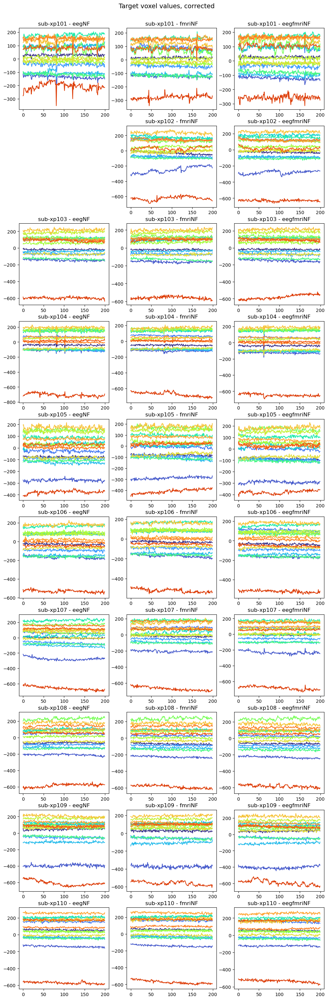

In [46]:
# Define a dictionary to store the corrected targets. 
dict_targets_values_corrected = dict()

# Plot the target voxel values by subject and condition. 
fig, axes = plt.subplots(nrows = 10, ncols = 3, figsize = (12, 38))
fig.suptitle('Target voxel values, corrected', fontsize = 14, y = 0.9)
subject_index = 0

# Iterate through all subjects. 
for subject in subjects:
    condition_index = 0

    # Define the subject dictionary. 
    dict_targets_values_corrected[subject] = dict()
    
    # Iterate through all conditions. 
    for condition in ['eegNF', 'fmriNF', 'eegfmriNF']:
        target_index = 0

        # Skip the current iteration for sub-xp102 and eegNF, since that run is missing. 
        if subject == 'sub-xp102' and condition == 'eegNF':
            axes[subject_index, condition_index].set_visible(False)
            condition_index += 1
            continue

        # Define the condition dictionary. 
        dict_targets_values_corrected[subject][condition] = dict()

        # Iterate through all target voxels. 
        for target_voxel in dict_targets_MNI_coordinates.keys():

            # Compute the corrected target voxel values. 
            target_voxel_values = dict_targets_values[subject][condition][target_voxel]
            coefficients = dict_regression_coefficients[subject][condition]
            x_values = range(target_voxel_values.shape[0])
            y_values = coefficients[0] * x_values + coefficients[1]
            target_voxel_values_corrected = target_voxel_values - y_values
            
            # Define colormap and select a color. 
            cm = plt.colormaps['turbo']
            c = cm(0.05 * target_index + 0.05)
    
            # Plot the corrected target voxel values. 
            axes[subject_index, condition_index].plot(target_voxel_values_corrected, color = c)
            axes[subject_index, condition_index].set_title(subject + ' - ' + condition)

            # Store the corrected target voxel values in the dictionary. 
            dict_targets_values_corrected[subject][condition][target_voxel] = target_voxel_values_corrected

            # Increment the target index. 
            target_index += 1

        # Increment the condition index. 
        condition_index += 1

    # Increment the subject index. 
    subject_index += 1

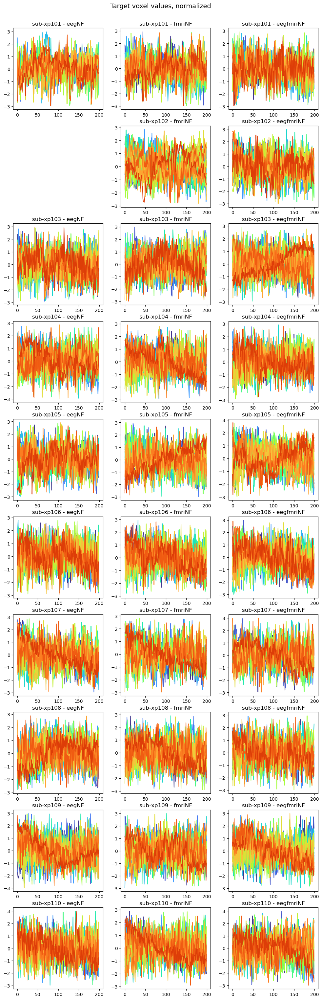

In [47]:
# Define a dictionary to store the normalized targets, and a DataFrame to store the outliers. 
dict_targets_values_normalized = dict()
df_outliers = pd.DataFrame()

# Plot the target voxel values by subject and condition. 
fig, axes = plt.subplots(nrows = 10, ncols = 3, figsize = (12, 38))
fig.suptitle('Target voxel values, normalized', fontsize = 14, y = 0.9)
subject_index = 0

# Iterate through all subjects. 
for subject in subjects:
    condition_index = 0

    # Define the subject dictionary. 
    dict_targets_values_normalized[subject] = dict()
    
    # Iterate through all conditions. 
    for condition in ['eegNF', 'fmriNF', 'eegfmriNF']:
        target_index = 0

        # Skip the current iteration for sub-xp102 and eegNF, since that run is missing. 
        if subject == 'sub-xp102' and condition == 'eegNF':
            axes[subject_index, condition_index].set_visible(False)
            condition_index += 1
            continue

        # Define the condition dictionary. 
        dict_targets_values_normalized[subject][condition] = dict()

        # Iterate through all target voxels. 
        for target_voxel in dict_targets_MNI_coordinates.keys():

            # Compute the normalized target voxel values. 
            target_voxel_values_corrected = dict_targets_values_corrected[subject][condition][target_voxel]
            target_voxel_values_normalized = (target_voxel_values_corrected - np.mean(target_voxel_values_corrected)) / np.std(target_voxel_values_corrected)

            # Iterate through all scans and replace the outliers (STD > 3) by the value of the previous scan. 
            outliers_counter = 0
            for scan in range(nb_scans):
                if np.abs(target_voxel_values_normalized[scan]) > 3:
                    target_voxel_values_normalized[scan] = target_voxel_values_normalized[scan - 1]
                    outliers_counter += 1
            df_outliers.loc[subject + '/' + condition, 'subject'] = subject
            df_outliers.loc[subject + '/' + condition, 'condition'] = condition
            df_outliers.loc[subject + '/' + condition, target_voxel] = outliers_counter
            
            # Define colormap and select a color. 
            cm = plt.colormaps['turbo']
            c = cm(0.05 * target_index + 0.05)
    
            # Plot the normalized target voxel values. 
            axes[subject_index, condition_index].plot(target_voxel_values_normalized, color = c)
            axes[subject_index, condition_index].set_title(subject + ' - ' + condition)

            # Store the normalized target voxel values in the dictionary. 
            dict_targets_values_normalized[subject][condition][target_voxel] = target_voxel_values_normalized

            # Increment the target index. 
            target_index += 1

        # Increment the condition index. 
        condition_index += 1

    # Increment the subject index. 
    subject_index += 1

# Change the indexes and the data type of the outliers DataFrame. 
df_outliers = df_outliers.set_index(['subject', 'condition'])
df_outliers = df_outliers.astype(int)

In [48]:
# Display the outliers DataFrame. 
df_outliers

pgACC  vmPFC  Right FPC 1  Right FPC 2  Right FPC 3  \
subject   condition                                                        
sub-xp101 eegNF          4      3            4            2            2   
          fmriNF         0      1            0            0            1   
          eegfmriNF      2      2            0            0            0   
sub-xp102 fmriNF         0      0            1            0            2   
          eegfmriNF      0      0            1            0            1   
sub-xp103 eegNF          0      0            1            1            0   
          fmriNF         0      0            1            1            0   
          eegfmriNF      0      0            1            0            0   
sub-xp104 eegNF          2      3            5            1            2   
          fmriNF         1      4            1            1            1   
          eegfmriNF      1      2            2            1            1   
sub-xp105 eegNF          0      2            0            0            0   
          fmriNF         1      0            1            0            0   
          eegfmriNF      0      0            1            0            0   
sub-xp106 eegNF          1      0            1            1            1   
          fmriNF         0      0            0            0            2   
          eegfmriNF      2      0            0            1            0   
sub-xp107 eegNF          0      2            1            0            1   
          fmriNF         1      0            0            0            1   
          eegfmriNF      0      1            1            1            1   
sub-xp108 eegNF          0      1            1            1            1   
          fmriNF         0      0            0            1            0   
          eegfmriNF      1      0            1            0            1   
sub-xp109 eegNF          0      0            1            0            2   
          fmriNF         0      1            0            2            0   
          eegfmriNF      1      0            0            0            0   
sub-xp110 eegNF          0      0            1            0            0   
          fmriNF         2      0            1            0            0   
          eegfmriNF      0      1            0            2            0   

                     dACC 1  dACC 2  Left post-LPC  Right post-LPC  \
subject   condition                                                  
sub-xp101 eegNF           2       3              1               0   
          fmriNF          0       3              1               2   
          eegfmriNF       0       0              0               1   
sub-xp102 fmriNF          0       0              2               0   
          eegfmriNF       0       1              0               2   
sub-xp103 eegNF           1       0              1               0   
          fmriNF          0       0              1               1   
          eegfmriNF       0       0              0               0   
sub-xp104 eegNF           3       2              0               2   
          fmriNF          3       3              0               1   
          eegfmriNF       1       0              1               1   
sub-xp105 eegNF           3       1              2               1   
          fmriNF          1       0              0               0   
          eegfmriNF       0       0              0               0   
sub-xp106 eegNF           1       0              1               0   
          fmriNF          1       0              0               0   
          eegfmriNF       0       1              0               0   
sub-xp107 eegNF           1       0              1               1   
          fmriNF          0       3              0               1   
          eegfmriNF       0       0              2               1   
sub-xp108 eegNF           0       0              0               1   
          fmriNF          0       1              1    

In [49]:
# Display the number of outliers by target voxel. 
print(df_outliers.sum())

pgACC                     19
vmPFC                     23
Right FPC 1               27
Right FPC 2               16
Right FPC 3               20
dACC 1                    18
dACC 2                    22
Left post-LPC             20
Right post-LPC            19
Left PMC 1                18
Left PMC 2                23
Left dorsal striatum      24
Right dorsal striatum     21
Left FPC                  30
Right FPC                 18
Left mid-LPC              20
Right ventral striatum    17
dtype: int64


In [50]:
# Display the proportion of outliers by target voxel. 
print(df_outliers.sum() / (df_outliers.shape[0] * nb_scans))

pgACC                     0.003276
vmPFC                     0.003966
Right FPC 1               0.004655
Right FPC 2               0.002759
Right FPC 3               0.003448
dACC 1                    0.003103
dACC 2                    0.003793
Left post-LPC             0.003448
Right post-LPC            0.003276
Left PMC 1                0.003103
Left PMC 2                0.003966
Left dorsal striatum      0.004138
Right dorsal striatum     0.003621
Left FPC                  0.005172
Right FPC                 0.003103
Left mid-LPC              0.003448
Right ventral striatum    0.002931
dtype: float64


In [51]:
# Store the baseline for all subjects. 
dict_baseline = dict()

# Iterate through all subjects. 
for subject in subjects:

    # Define the subject dictionary. 
    dict_baseline[subject] = dict()

    # Iterate through all conditions. 
    for condition in ['eegNF', 'fmriNF', 'eegfmriNF']:

        # Skip the current iteration for sub-xp102 and eegNF, since that run is missing. 
        if subject == 'sub-xp102' and condition == 'eegNF':
            continue

        # Define the condition dictionary. 
        dict_baseline[subject][condition] = dict()

        # Iterate through all target voxels. 
        for target_voxel in dict_targets_MNI_coordinates.keys():

            # Store the baseline, which is now zero. 
            dict_baseline[subject][condition][target_voxel] = np.zeros((nb_scans))

In [52]:
# Create directories for the targets, the features, and the baseline. 
os.mkdir(preprocessed_data_path + 'targets/')
os.mkdir(preprocessed_data_path + 'features/')
os.mkdir(preprocessed_data_path + 'baseline/')

# Save the targets into a Pickle file. 
with open(preprocessed_data_path + 'targets/dict_targets.p', 'wb') as file:
    pickle.dump(dict_targets_values_normalized, file)

# Save the baseline into a Pickle file. 
with open(preprocessed_data_path + 'baseline/dict_baseline.p', 'wb') as file:
    pickle.dump(dict_baseline, file)